[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Segment Anything Model (SAM)

---

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/facebookresearch/segment-anything) [![arXiv](https://img.shields.io/badge/arXiv-2304.02643-b31b1b.svg)](https://arxiv.org/abs/2304.02643)

Segment Anything Model (SAM): a new AI model from Meta AI that can "cut out" any object, in any image, with a single click. SAM is a promptable segmentation system with zero-shot generalization to unfamiliar objects and images, without the need for additional training. This notebook is an extension of the [official notebook](https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb) prepared by Meta AI.

![segment anything model](https://media.roboflow.com/notebooks/examples/segment-anything-model-paper.png)

## Complementary Materials

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-anything-with-sam.ipynb) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/D-D6ZmadzPE) [![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/how-to-use-segment-anything-model-sam)

We recommend that you follow along in this notebook while reading the blog post on Segment Anything Model.

![segment anything model blogpost](https://media.roboflow.com/notebooks/examples/segment-anything-model-blogpost.png)

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- **Before you start** - Make sure you have access to the GPU
- Install Segment Anything Model (SAM)
- Download Example Data
- Load Model
- Automated Mask Generation
- Generate Segmentation with Bounding Box
- Segment Anything in Roboflow Universe Dataset

## Let's begin!

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Wed Oct 25 09:42:27 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8    13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


## Install Segment Anything Model (SAM) and other dependencies

In [3]:
!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'

  Preparing metadata (setup.py) ... done


In [4]:
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.6/77.6 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 81.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This

### Download SAM weights

In [5]:
!mkdir -p {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights

In [6]:
import os

CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


## Download Example Data

**NONE:** Let's download few example images. Feel free to use your images or videos.

In [7]:
!mkdir -p {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg -P {HOME}/data

## Load Model

In [8]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

In [9]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

## Automated Mask Generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [10]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [15]:
import os

IMAGE_NAME = "adversarial.png"
IMAGE_PATH = '/content/Screenshot 2023-11-25 125630.png'

### Generate masks with SAM

In [16]:
import cv2
import supervision as sv

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam_result = mask_generator.generate(image_rgb)

### Output format

`SamAutomaticMaskGenerator` returns a `list` of masks, where each mask is a `dict` containing various information about the mask:

* `segmentation` - `[np.ndarray]` - the mask with `(W, H)` shape, and `bool` type
* `area` - `[int]` - the area of the mask in pixels
* `bbox` - `[List[int]]` - the boundary box of the mask in `xywh` format
* `predicted_iou` - `[float]` - the model's own prediction for the quality of the mask
* `point_coords` - `[List[List[float]]]` - the sampled input point that generated this mask
* `stability_score` - `[float]` - an additional measure of mask quality
* `crop_box` - `List[int]` - the crop of the image used to generate this mask in `xywh` format

In [47]:
# Iterate through each bounding box in `sam_result` and print additional information
for i, mask_info in enumerate(sam_result, start=1):
    # Access bounding box information
    bbox = mask_info['bbox']
    predicted_iou = mask_info['predicted_iou']
    stability_score = mask_info['stability_score']
    crop_box = mask_info['crop_box']
    segmentation = mask_info['segmentation']

    # Print the information
    print(f'Bounding Box {i} Information:')
    print(f'  Bounding Box (xywh): {bbox}')
    print(f'  Predicted IOU: {predicted_iou}')
    print(f'  Stability Score: {stability_score}')
    print(f'  Crop Box (xywh): {crop_box}')
    print(f'segmentation:{segmentation}')
    print()


Bounding Box 1 Information:
  Bounding Box (xywh): [3, 52, 140, 140]
  Predicted IOU: 1.0388039350509644
  Stability Score: 0.9891765117645264
  Crop Box (xywh): [0, 0, 421, 242]
segmentation:[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]

Bounding Box 2 Information:
  Bounding Box (xywh): [0, 1, 420, 239]
  Predicted IOU: 1.019341230392456
  Stability Score: 0.9821150302886963
  Crop Box (xywh): [0, 0, 421, 242]
segmentation:[[False False False ... False False False]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ... False False False]]

Bounding Box 3 Information:
  Bounding Box (xywh): [254, 160, 19, 18]
  Predicted IOU: 1

In [17]:
print(sam_result[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


In [18]:
len(sam_result)

43

In [19]:
first_mask_info = sam_result[0]

segmentation_mask = first_mask_info['segmentation']
area = first_mask_info['area']
bbox = first_mask_info['bbox']
predicted_iou = first_mask_info['predicted_iou']
point_coords = first_mask_info['point_coords']
stability_score = first_mask_info['stability_score']
crop_box = first_mask_info['crop_box']

# Print the information
print("Segmentation Mask:", segmentation_mask)
print("Area:", area)
print("Bounding Box (xywh):", bbox)
print("Predicted IOU:", predicted_iou)
print("Point Coordinates:", point_coords)
print("Stability Score:", stability_score)
print("Crop Box (xywh):", crop_box)

Segmentation Mask: [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
Area: 15717
Bounding Box (xywh): [3, 52, 140, 140]
Predicted IOU: 1.0388039350509644
Point Coordinates: [[59.203125, 147.46875]]
Stability Score: 0.9891765117645264
Crop Box (xywh): [0, 0, 421, 242]


### Results visualisation with Supervision

As of version `0.5.0` Supervision has native support for SAM.

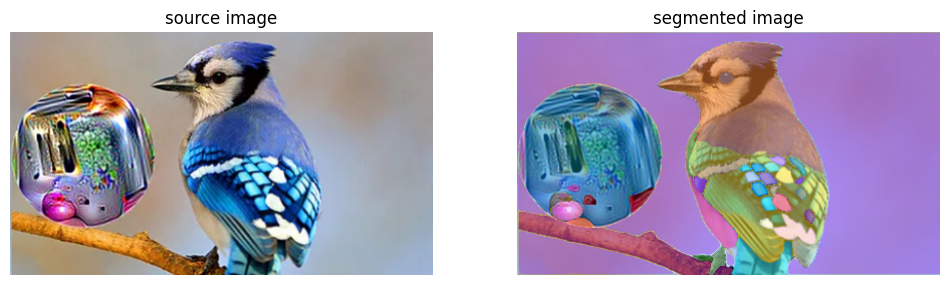

In [20]:
# mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

# detections = sv.Detections.from_sam(sam_result=sam_result)

# annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# sv.plot_images_grid(
#     images=[image_bgr, annotated_image],
#     grid_size=(1, 2),
#     titles=['source image', 'segmented image']
# )

In [21]:
# Assuming `sam_result` is a list of dictionaries with bounding box information

all_bounding_boxes = []

for mask_info in sam_result:
    # Access bounding box information
    bbox = mask_info['bbox']

    # Append the bounding box coordinates to the list
    all_bounding_boxes.append(bbox)

# Print or use the collected bounding box coordinates
for i, bbox in enumerate(all_bounding_boxes, start=1):
    print(f"Bounding Box {i} (xywh): {bbox}")


Bounding Box 1 (xywh): [3, 52, 140, 140]
Bounding Box 2 (xywh): [0, 1, 420, 239]
Bounding Box 3 (xywh): [254, 160, 19, 18]
Bounding Box 4 (xywh): [258, 134, 16, 16]
Bounding Box 5 (xywh): [2, 179, 211, 62]
Bounding Box 6 (xywh): [142, 10, 167, 230]
Bounding Box 7 (xywh): [171, 142, 48, 73]
Bounding Box 8 (xywh): [242, 185, 12, 10]
Bounding Box 9 (xywh): [33, 159, 32, 28]
Bounding Box 10 (xywh): [277, 154, 11, 13]
Bounding Box 11 (xywh): [240, 139, 18, 13]
Bounding Box 12 (xywh): [246, 130, 14, 9]
Bounding Box 13 (xywh): [179, 125, 52, 20]
Bounding Box 14 (xywh): [234, 149, 15, 14]
Bounding Box 15 (xywh): [243, 164, 13, 13]
Bounding Box 16 (xywh): [252, 123, 14, 9]
Bounding Box 17 (xywh): [35, 168, 30, 19]
Bounding Box 18 (xywh): [227, 139, 13, 10]
Bounding Box 19 (xywh): [214, 205, 59, 36]
Bounding Box 20 (xywh): [201, 40, 13, 11]
Bounding Box 21 (xywh): [291, 166, 10, 15]
Bounding Box 22 (xywh): [45, 10, 264, 230]
Bounding Box 23 (xywh): [233, 131, 14, 8]
Bounding Box 24 (xywh): [66, 

In [22]:
# import cv2
# import numpy as np

# # Assuming `sam_result` is a list of dictionaries with bounding box information
# # Assuming the image is loaded as `image_bgr`

# # Load the original image
# image_bgr = cv2.imread('/content/Screenshot 2023-11-25 125630.png')
# image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)  # Convert to grayscale for simplicity

# # Define a function to calculate noise within a region of interest (ROI)
# def calculate_noise(image, bbox):
#     x, y, w, h = bbox
#     roi = image[y:y+h, x:x+w]
#     noise = np.std(roi)
#     return noise

# # Iterate through each bounding box in `sam_result` and calculate noise
# for i, mask_info in enumerate(sam_result, start=1):
#     # Access bounding box information
#     bbox = mask_info['bbox']

#     # Convert to integers
#     bbox = [int(coord) for coord in bbox]

#     # Calculate noise within the bounding box
#     noise = calculate_noise(image_gray, bbox)

#     # Print or use the noise value
#     print(f'Bounding Box {i} Noise: {noise}')


Bounding Box 1 Noise: 49.552845193007826
Bounding Box 2 Noise: 45.82228813430493
Bounding Box 3 Noise: 84.80665426388879
Bounding Box 4 Noise: 74.18541356585875
Bounding Box 5 Noise: 35.982892944077605
Bounding Box 6 Noise: 58.228067840344345
Bounding Box 7 Noise: 53.64422709373898
Bounding Box 8 Noise: 72.65093436349521
Bounding Box 9 Noise: 46.345740791715095
Bounding Box 10 Noise: 61.1377105302659
Bounding Box 11 Noise: 72.73936683039852
Bounding Box 12 Noise: 44.43141036201045
Bounding Box 13 Noise: 83.24708689729687
Bounding Box 14 Noise: 61.839488664417686
Bounding Box 15 Noise: 54.312388826000785
Bounding Box 16 Noise: 54.334643896291986
Bounding Box 17 Noise: 47.473349961868415
Bounding Box 18 Noise: 58.36723973734078
Bounding Box 19 Noise: 54.365469852641844
Bounding Box 20 Noise: 27.433561977150706
Bounding Box 21 Noise: 68.83941506627338
Bounding Box 22 Noise: 53.56531441730733
Bounding Box 23 Noise: 60.75580250696476
Bounding Box 24 Noise: 46.52738160877956
Bounding Box 25 

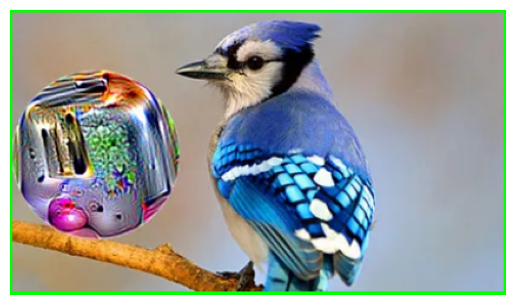

In [32]:
import cv2
import matplotlib.pyplot as plt

# Bounding Box Coordinates
# FIGURE HOW TO GET THE LARGEST BOX
boxes = [
    [0, 1, 420, 239],

]

# Load the image
image_path = "/content/Screenshot 2023-11-25 125630.png"
image = cv2.imread(image_path)

# Draw bounding boxes and annotate
for i, box in enumerate(boxes):
    x, y, w, h = box
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image, f'Box {i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Display the image with bounding boxes
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


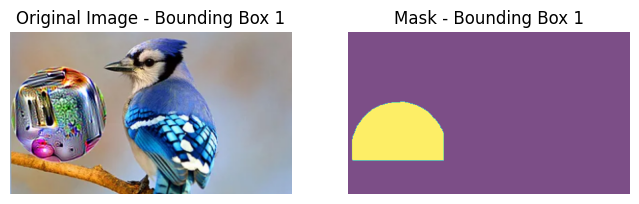

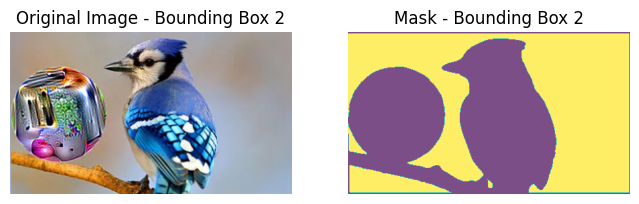

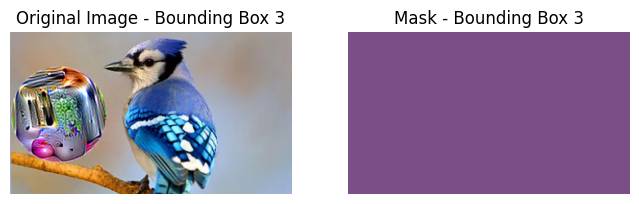

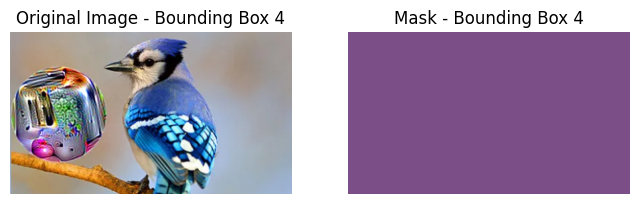

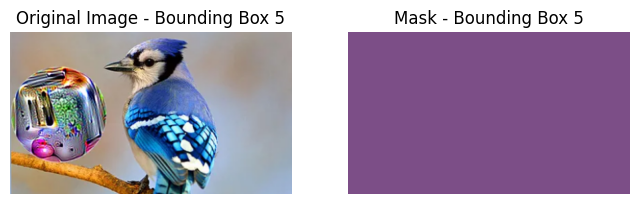

...

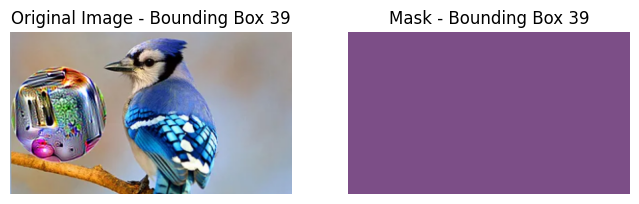

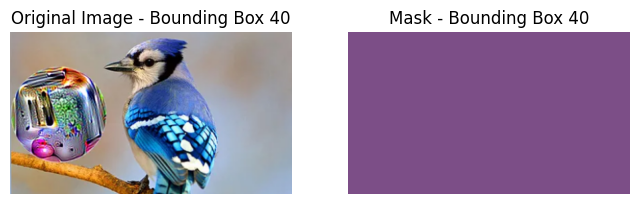

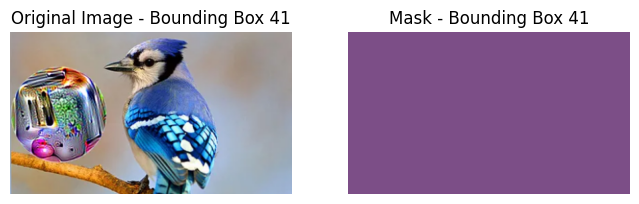

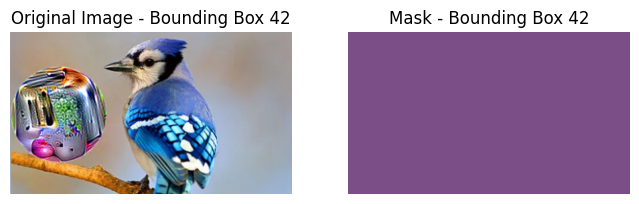

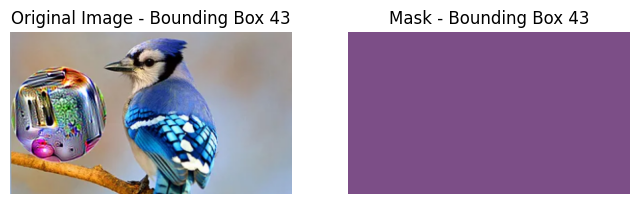

In [30]:
# FIND THE MASK WITH THE LARGEST AREA - CODEWISE

import cv2
import matplotlib.pyplot as plt
import numpy as np

# Assuming `sam_result` is a list of dictionaries with bounding box information
# Assuming the original image is loaded as `image_bgr`

# Load the original image
image_bgr = cv2.imread('/content/Screenshot 2023-11-25 125630.png')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Iterate through each bounding box in `sam_result` and plot the corresponding mask
for i, mask_info in enumerate(sam_result, start=1):
    # Access bounding box information
    bbox = mask_info['bbox']

    # Convert to integers
    bbox = [int(coord) for coord in bbox]

    # Create an empty mask with the same dimensions as the image
    mask = np.zeros_like(image_rgb[:, :, 0], dtype=np.uint8)

    # Get the region of interest (ROI) from the mask
    roi_mask = mask_info['segmentation']

    # Make sure the dimensions match before copying the values
    min_height = min(roi_mask.shape[0], bbox[3])
    min_width = min(roi_mask.shape[1], bbox[2])

    # Calculate the starting position within the mask
    start_y = bbox[1] + (bbox[3] - min_height) // 2
    start_x = bbox[0] + (bbox[2] - min_width) // 2

    # Populate the mask within the bounding box
    mask[start_y:start_y+min_height, start_x:start_x+min_width] = roi_mask[:min_height, :min_width]

    # Plot the original image
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title(f'Original Image - Bounding Box {i}')
    plt.axis('off')

    # Plot the mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='viridis', alpha=0.7)  # Adjust the colormap as needed
    plt.title(f'Mask - Bounding Box {i}')
    plt.axis('off')

    plt.show()


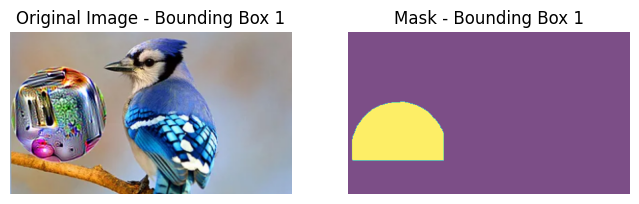

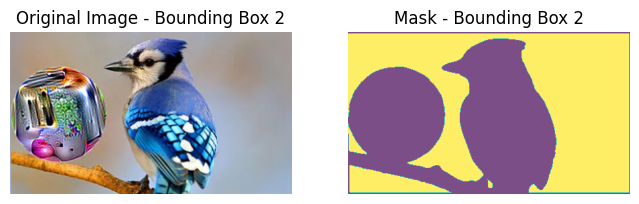

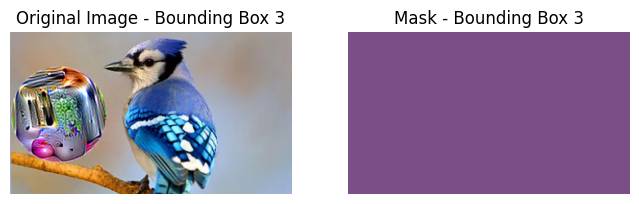

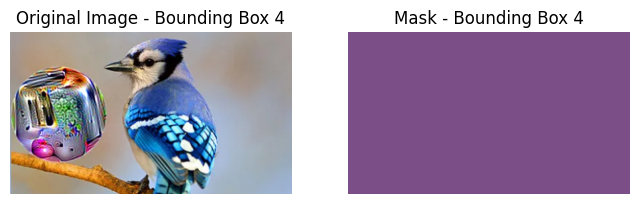

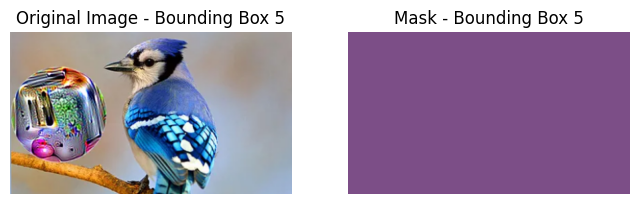

...

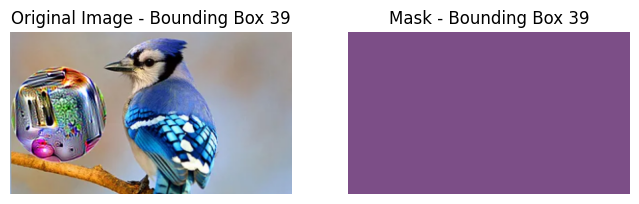

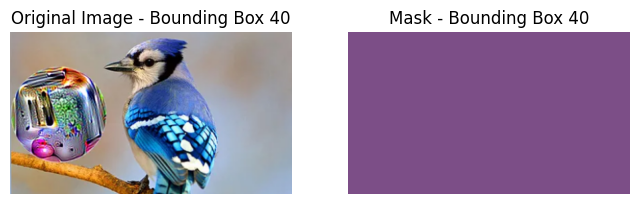

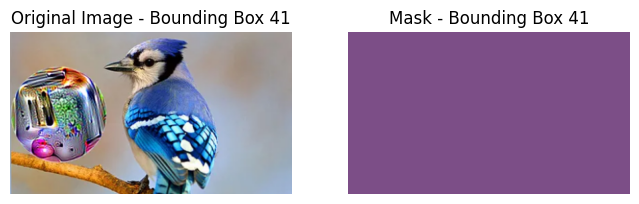

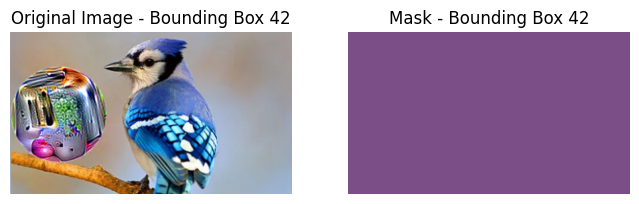

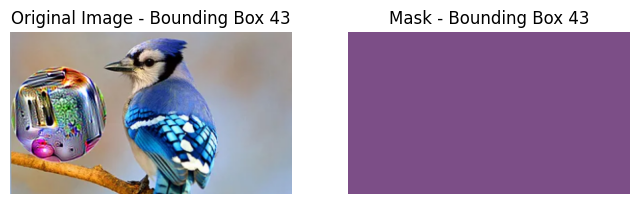

In [45]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Assuming `sam_result` is a list of dictionaries with bounding box information
# Assuming the original image is loaded as `image_bgr`

# Load the original image
image_bgr = cv2.imread('/content/Screenshot 2023-11-25 125630.png')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Iterate through each bounding box in `sam_result` and plot the corresponding mask
for i, mask_info in enumerate(sam_result, start=1):
    # Access bounding box information
    bbox = mask_info['bbox']

    # Convert to integers
    bbox = [int(coord) for coord in bbox]

    # Create an empty mask with the same dimensions as the image
    mask = np.zeros_like(image_rgb[:, :, 0], dtype=np.uint8)

    # Get the region of interest (ROI) from the mask
    roi_mask = mask_info['segmentation']

    # Make sure the dimensions match before copying the values
    min_height = min(roi_mask.shape[0], bbox[3])
    min_width = min(roi_mask.shape[1], bbox[2])

    # Calculate the starting position within the mask
    start_y = bbox[1]
    start_x = bbox[0]

    # Populate the mask within the bounding box
    mask[start_y:start_y+min_height, start_x:start_x+min_width] = roi_mask[:min_height, :min_width]

    # Plot the original image
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title(f'Original Image - Bounding Box {i}')
    plt.axis('off')

    # Plot the mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='viridis', alpha=0.7)  # Adjust the colormap as needed
    plt.title(f'Mask - Bounding Box {i}')
    plt.axis('off')

    plt.show()


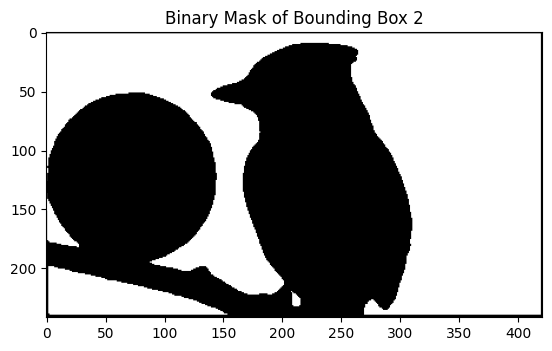

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Index of the bounding box you want to display (assuming Bounding Box 2)
box_index_to_display = 1  # Python uses 0-based indexing

# Get the bounding box information
mask_info = sam_result[box_index_to_display]
bbox = mask_info['bbox']

# Convert to integers
bbox = [int(coord) for coord in bbox]

# Create an empty mask with the same dimensions as the image
mask = np.zeros((image_bgr.shape[0], image_bgr.shape[1]), dtype=np.uint8)

# Get the binary mask from the segmentation
binary_mask = mask_info['segmentation']

# Make sure the dimensions match before copying the values
min_height = min(binary_mask.shape[0], bbox[3])
min_width = min(binary_mask.shape[1], bbox[2])

# Calculate the starting position within the mask
start_y = bbox[1]
start_x = bbox[0]

# Populate the mask within the bounding box
mask[start_y:start_y+min_height, start_x:start_x+min_width] = binary_mask[:min_height, :min_width]

# Display the binary mask
plt.imshow(mask, cmap='gray')
plt.title('Binary Mask of Bounding Box 2')
plt.show()


### Interaction with segmentation results

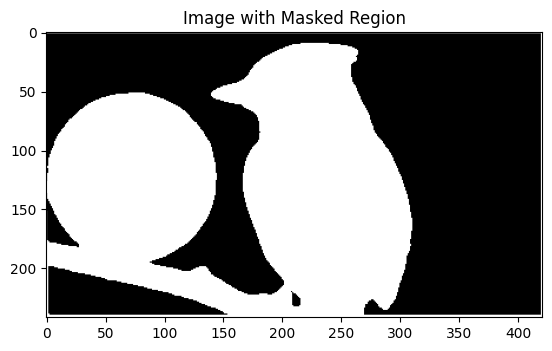

<Figure size 640x480 with 0 Axes>

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Index of the bounding box you want to display (assuming Bounding Box 2)
box_index_to_display = 1  # Python uses 0-based indexing

# Get the bounding box information
mask_info = sam_result[box_index_to_display]
bbox = mask_info['bbox']

# Convert to integers
bbox = [int(coord) for coord in bbox]

# Create an empty mask with the same dimensions as the image
mask = np.zeros((image_bgr.shape[0], image_bgr.shape[1]), dtype=np.uint8)

# Get the binary mask from the segmentation
binary_mask = mask_info['segmentation']

# Make sure the dimensions match before copying the values
min_height = min(binary_mask.shape[0], bbox[3])
min_width = min(binary_mask.shape[1], bbox[2])

# Calculate the starting position within the mask
start_y = bbox[1]
start_x = bbox[0]

# Populate the mask within the bounding box
mask[start_y:start_y+min_height, start_x:start_x+min_width] = binary_mask[:min_height, :min_width]

# Create an empty image with white background
result_image = np.ones_like(image_bgr) * 255

# Set the region inside the mask to black
result_image[mask == 1] = 0

# Display the result
plt.imshow(result_image)
plt.title('Image with Masked Region')
plt.show()



In [44]:
#SAVING THE MASK

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Index of the bounding box you want to display (assuming Bounding Box 2)
box_index_to_display = 1  # Python uses 0-based indexing

# Get the bounding box information
mask_info = sam_result[box_index_to_display]
bbox = mask_info['bbox']

# Convert to integers
bbox = [int(coord) for coord in bbox]

# Create an empty mask with the same dimensions as the image
mask = np.zeros((image_bgr.shape[0], image_bgr.shape[1]), dtype=np.uint8)

# Get the binary mask from the segmentation
binary_mask = mask_info['segmentation']

# Make sure the dimensions match before copying the values
min_height = min(binary_mask.shape[0], bbox[3])
min_width = min(binary_mask.shape[1], bbox[2])

# Calculate the starting position within the mask
start_y = bbox[1]
start_x = bbox[0]

# Populate the mask within the bounding box
mask[start_y:start_y+min_height, start_x:start_x+min_width] = binary_mask[:min_height, :min_width]

# Create an empty image with white background
result_image = np.ones_like(image_bgr) * 255

# Set the region inside the mask to black
result_image[mask == 1] = 0

# Save the result image
result_image_path = '/content/image_with_mask.png'
cv2.imwrite(result_image_path, result_image)

print(f"Result Image saved at {result_image_path}")


Result Image saved at /content/image_with_mask.png


In [24]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]



## Generate Segmentation with Bounding Box

The `SamPredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

In [25]:
# mask_predictor = SamPredictor(sam)

In [ ]:
# import os

# IMAGE_NAME = "toaster"
# IMAGE_PATH = '/content/Screenshot 2023-11-25 125606.png'

### Draw Box



In [ ]:
# # helper function that loads an image before adding it to the widget

# import base64

# def encode_image(filepath):
#     with open(filepath, 'rb') as f:
#         image_bytes = f.read()
#     encoded = str(base64.b64encode(image_bytes), 'utf-8')
#     return "data:image/jpg;base64,"+encoded

**NOTE:** Execute cell below and use your mouse to draw bounding box on the image 👇

In [ ]:
# IS_COLAB = True

# if IS_COLAB:
#     from google.colab import output
#     output.enable_custom_widget_manager()

# from jupyter_bbox_widget import BBoxWidget

# widget = BBoxWidget()
# widget.image = encode_image(IMAGE_PATH)
# widget

In [ ]:
# widget.bboxes

### Generate masks with SAM

**NOTE:** `SamPredictor.predict` method takes `np.ndarray` `box` argument in `[x_min, y_min, x_max, y_max]` format. Let's reorganise your data first

In [ ]:
# import numpy as np

# # default_box is going to be used if you will not draw any box on image above
# default_box = {'x': 68, 'y': 247, 'width': 555, 'height': 678, 'label': ''}

# box = widget.bboxes[0] if widget.bboxes else default_box
# box = np.array([
#     box['x'],
#     box['y'],
#     box['x'] + box['width'],
#     box['y'] + box['height']
# ])

In [ ]:
# import cv2
# import numpy as np
# import supervision as sv

# image_bgr = cv2.imread(IMAGE_PATH)
# image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# mask_predictor.set_image(image_rgb)

# masks, scores, logits = mask_predictor.predict(
#     box=box,
#     multimask_output=True
# )

### Results visualisation with Supervision

In [ ]:
# box_annotator = sv.BoxAnnotator(color=sv.Color.red())
# mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

# detections = sv.Detections(
#     xyxy=sv.mask_to_xyxy(masks=masks),
#     mask=masks
# )
# detections = detections[detections.area == np.max(detections.area)]

# source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
# segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# sv.plot_images_grid(
#     images=[source_image, segmented_image],
#     grid_size=(1, 2),
#     titles=['source image', 'segmented image']
# )

### Interaction with segmentation results

In [ ]:
# import supervision as v

# sv.plot_images_grid(
#     images=masks,
#     grid_size=(1, 4),
#     size=(16, 4)
# )

## Segment Anything in Roboflow Universe Dataset

### Utils Supporting Dataset Processing

A couple of helper functions that, unfortunately, we have to write ourselves to facilitate the processing of COCO annotations.

In [ ]:
# import numpy as np
# from dataclasses import dataclass
# from typing import List, Tuple, Union, Optional
# from dataclasses_json import dataclass_json
# from supervision import Detections


# @dataclass_json
# @dataclass
# class COCOCategory:
#     id: int
#     name: str
#     supercategory: str


# @dataclass_json
# @dataclass
# class COCOImage:
#     id: int
#     width: int
#     height: int
#     file_name: str
#     license: int
#     date_captured: str
#     coco_url: Optional[str] = None
#     flickr_url: Optional[str] = None


# @dataclass_json
# @dataclass
# class COCOAnnotation:
#     id: int
#     image_id: int
#     category_id: int
#     segmentation: List[List[float]]
#     area: float
#     bbox: Tuple[float, float, float, float]
#     iscrowd: int


# @dataclass_json
# @dataclass
# class COCOLicense:
#     id: int
#     name: str
#     url: str


# @dataclass_json
# @dataclass
# class COCOJson:
#     images: List[COCOImage]
#     annotations: List[COCOAnnotation]
#     categories: List[COCOCategory]
#     licenses: List[COCOLicense]


# def load_coco_json(json_file: str) -> COCOJson:
#     import json

#     with open(json_file, "r") as f:
#         json_data = json.load(f)

#     return COCOJson.from_dict(json_data)


# class COCOJsonUtility:
#     @staticmethod
#     def get_annotations_by_image_id(coco_data: COCOJson, image_id: int) -> List[COCOAnnotation]:
#         return [annotation for annotation in coco_data.annotations if annotation.image_id == image_id]

#     @staticmethod
#     def get_annotations_by_image_path(coco_data: COCOJson, image_path: str) -> Optional[List[COCOAnnotation]]:
#         image = COCOJsonUtility.get_image_by_path(coco_data, image_path)
#         if image:
#             return COCOJsonUtility.get_annotations_by_image_id(coco_data, image.id)
#         else:
#             return None

#     @staticmethod
#     def get_image_by_path(coco_data: COCOJson, image_path: str) -> Optional[COCOImage]:
#         for image in coco_data.images:
#             if image.file_name == image_path:
#                 return image
#         return None

#     @staticmethod
#     def annotations2detections(annotations: List[COCOAnnotation]) -> Detections:
#         class_id, xyxy = [], []

#         for annotation in annotations:
#             x_min, y_min, width, height = annotation.bbox
#             class_id.append(annotation.category_id)
#             xyxy.append([
#                 x_min,
#                 y_min,
#                 x_min + width,
#                 y_min + height
#             ])

#         return Detections(
#             xyxy=np.array(xyxy, dtype=int),
#             class_id=np.array(class_id, dtype=int)
#         )

### Download Dataset from Roboflow

In [ ]:
# %cd {HOME}

# import roboflow
# from roboflow import Roboflow

# roboflow.login()

# rf = Roboflow()

# project = rf.workspace("hashira-fhxpj").project("mri-brain-tumor")
# dataset = project.version(1).download("coco")

In [ ]:
# import os

# DATA_SET_SUBDIRECTORY = "test"
# ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
# IMAGES_DIRECTORY_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY)
# ANNOTATIONS_FILE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, ANNOTATIONS_FILE_NAME)

In [ ]:
# coco_data = load_coco_json(json_file=ANNOTATIONS_FILE_PATH)

# CLASSES = [
#     category.name
#     for category
#     in coco_data.categories
#     if category.supercategory != 'none'
# ]

# IMAGES = [
#     image.file_name
#     for image
#     in coco_data.images
# ]

In [ ]:
# CLASSES

### Single Image Bounding Box to Mask

In [ ]:
# # set random seed to allow easy reproduction of the experiment

# import random
# random.seed(10)

In [ ]:
# EXAMPLE_IMAGE_NAME = random.choice(IMAGES)
# EXAMPLE_IMAGE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, EXAMPLE_IMAGE_NAME)

# # load dataset annotations
# annotations = COCOJsonUtility.get_annotations_by_image_path(coco_data=coco_data, image_path=EXAMPLE_IMAGE_NAME)
# ground_truth = COCOJsonUtility.annotations2detections(annotations=annotations)

# # small hack - coco numerate classes from 1, model from 0 + we drop first redundant class from coco json
# ground_truth.class_id = ground_truth.class_id - 1

# # load image
# image_bgr = cv2.imread(EXAMPLE_IMAGE_PATH)
# image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# # initiate annotator
# bounding_box_annotator = sv.BoundingBoxAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)
# mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

# # annotate ground truth
# annotated_frame_ground_truth = bounding_box_annotator.annotate(scene=image_bgr.copy(), detections=ground_truth)

# # run SAM inference
# mask_predictor.set_image(image_rgb)

# masks, scores, logits = mask_predictor.predict(
#     box=ground_truth.xyxy[0],
#     multimask_output=True
# )

# detections = sv.Detections(
#     xyxy=sv.mask_to_xyxy(masks=masks),
#     mask=masks
# )
# detections = detections[detections.area == np.max(detections.area)]

# annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# sv.plot_images_grid(
#     images=[annotated_frame_ground_truth, annotated_image],
#     grid_size=(1, 2),
#     titles=['source image', 'segmented image']
# )

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.